In [1]:
import numpy as np
import matplotlib.pyplot as plt
import firtez_dz as frz
from astropy.io import fits
from matplotlib.colors import CenteredNorm, TwoSlopeNorm

In [2]:
plt.rc('text', usetex = False)

In [3]:
atm = frz.read_model('/dat/xenosh/muram_plage_pore/20000/muram_020000_nx1536_ny1536_nz240_d6.bin')

In [ ]:
atm = frz.read_model('/dat/xenosh/muram_plage_pore/20000/bin/out_muram_020000_nx192_ny192_nz80_dz12.bin')

## stokes

In [4]:
muramdir = '/dat/milic/MURaM_400G_plage_pore/'

In [5]:
time = np.fromfile(muramdir+'2D/Pore_10Mm_6x6km_res_Bz400G_time_012000_to_044450.dat',dtype=np.float64)

In [6]:
nsnaps = time.size //2

In [7]:
time = time.reshape(2,nsnaps)

In [8]:
time[0,160]

20000.0

In [9]:
nx = 1536
ny = 1536
nz = 1056

In [16]:
slice = np.memmap(muramdir+'2D/Pore_10Mm_6x6km_res_Bz400G_Iout_bref_012000_to_044450.dat',dtype=np.float32,mode='r',shape=(nsnaps,nx,ny))

In [10]:
stokes = frz.read_profile('/dat/xenosh/muram_plage_pore/20000/stokes.bin')

In [ ]:
stokes.shape

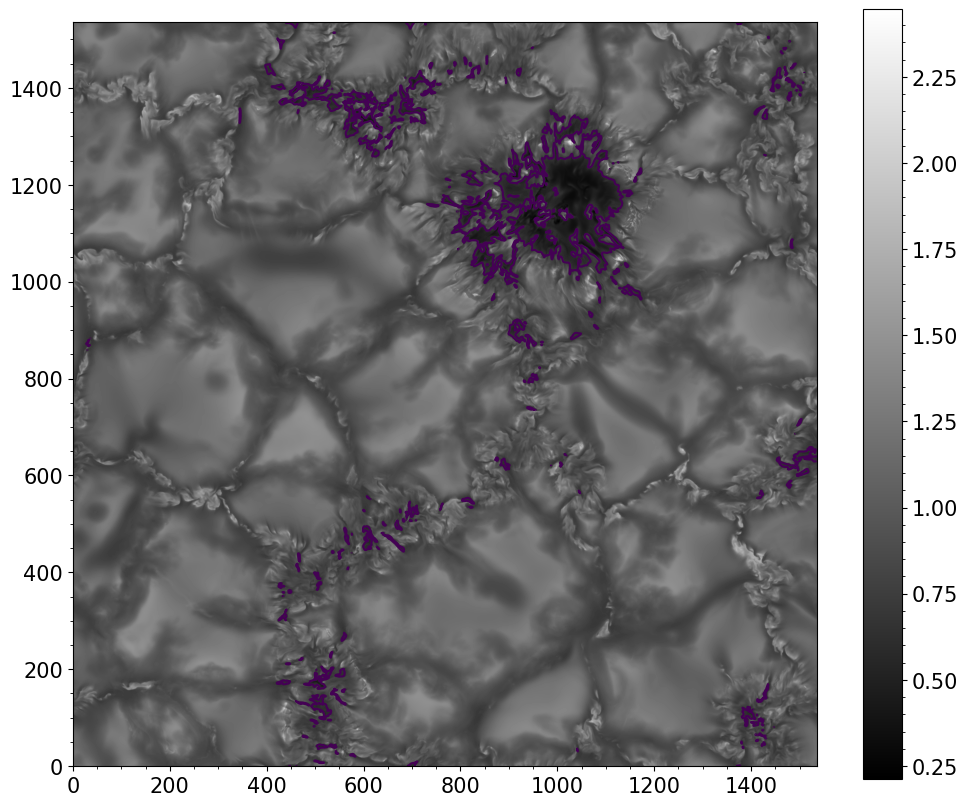

In [10]:
plt.figure(figsize=(12,10))
plt.imshow(stokes.stki[100,:,:].T,origin='lower',cmap='gray')
plt.colorbar()
plt.contour(stokes.stki[100,:,:].T/1.026,levels=[0.65])

In [70]:
np.mean(stokes.stki[100,:,:])

1.0261030871601582

In [13]:
print(np.std(stokes.stki[100,:,:]))

0.1901950532357725


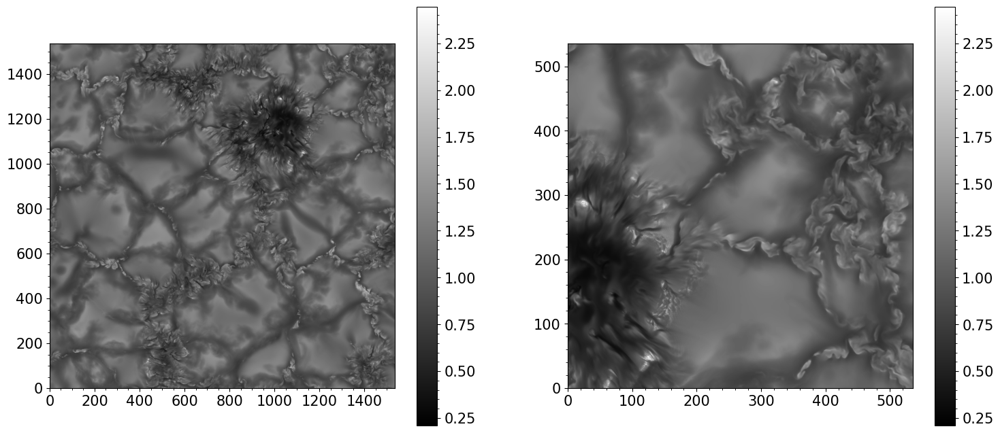

In [82]:
plt.figure(figsize=(18,8))
plt.subplot(121)
plt.imshow(stokes.stki[100,:,:].T,origin='lower',cmap='gray')
plt.colorbar()
plt.subplot(122)
plt.imshow(stokes.stki[100,1000:,1000:].T,origin='lower',cmap='gray')
plt.colorbar()

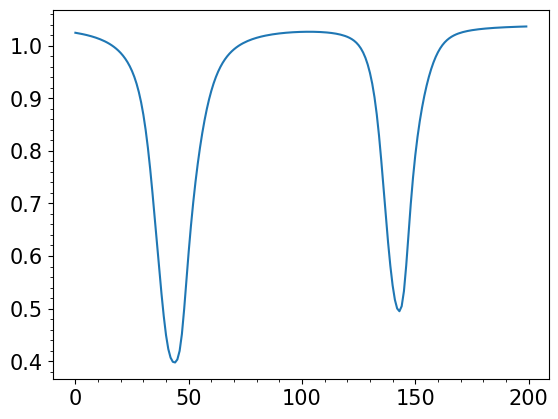

In [83]:
plt.plot(np.mean(stokes.stki,axis=(1,2)))

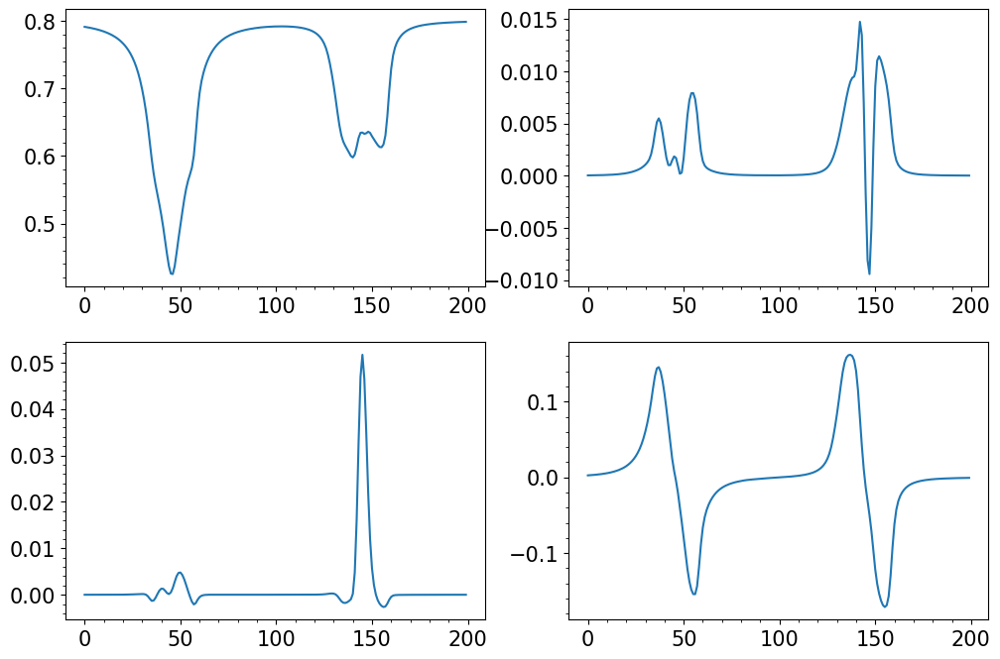

In [84]:
x = 480
y = 160
plt.figure(figsize=(12,8))
plt.subplot(221)
plt.plot(stokes.stki[:,x,y])
plt.subplot(222)
plt.plot(stokes.stkq[:,x,y])
plt.subplot(223)
plt.plot(stokes.stku[:,x,y])
plt.subplot(224)
plt.plot(stokes.stkv[:,x,y])

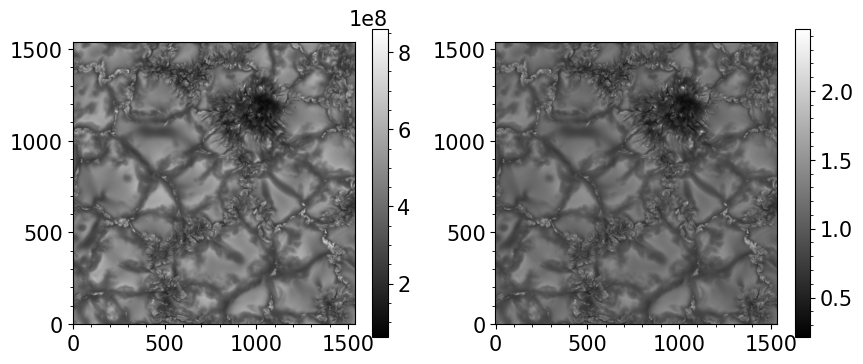

In [85]:
plt.figure(figsize=(10,4))
plt.subplot(121)
plt.imshow(slice[160,:,:].T,origin='lower',cmap='gray')
plt.colorbar()
plt.subplot(122)
plt.imshow(stokes.stki[100,:,:].T,origin='lower',cmap='gray')
plt.colorbar()

Text(0.5, 0.98, 't = 381.4553527832031')

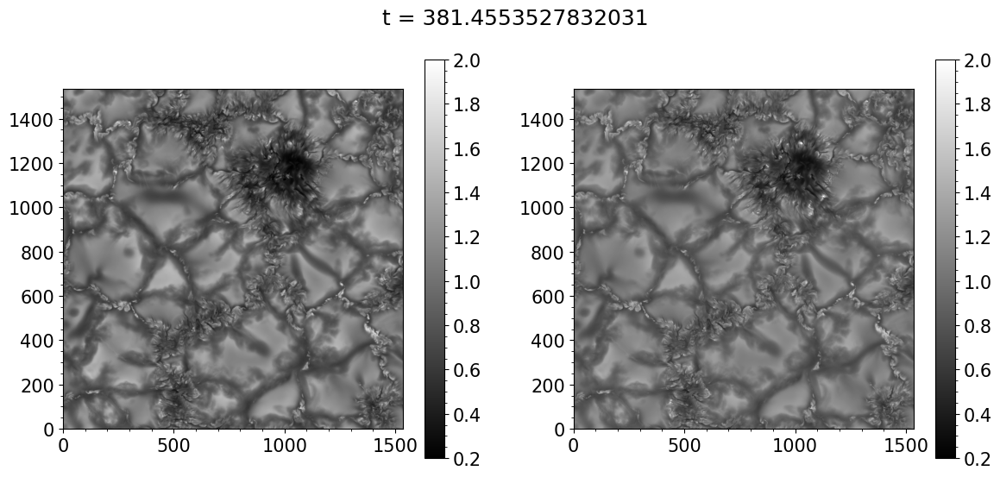

In [26]:
plt.figure(figsize=(14,6))
plt.subplot(121)
plt.imshow(I[:,:].T,origin='lower',cmap='gray',vmin=0.2,vmax=2.)
plt.colorbar()
plt.subplot(122)
plt.imshow(I_630[:,:].T,origin='lower',cmap='gray',vmin=0.2,vmax=2.)
plt.colorbar()
plt.suptitle('t = '+ str(time[1,160]) )

Text(0.5, 1.0, '$I_{muram}$ - $I_{frz}$')

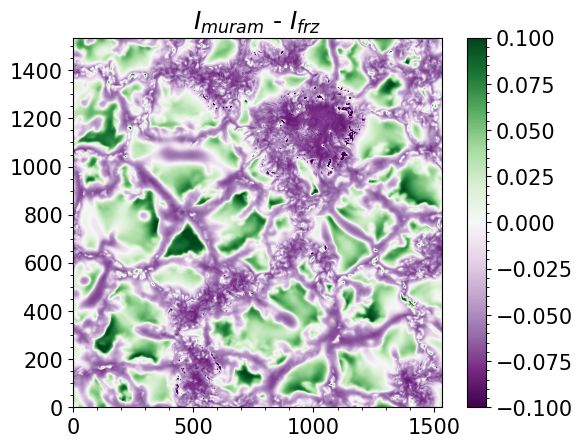

In [90]:
plt.imshow(I[:,:].T-I_630[:,:].T,origin='lower',cmap='PRGn',vmin=-0.1,vmax=0.1)
plt.colorbar()
plt.title(r'$I_{muram}$ - $I_{frz}$')

In [91]:
np.mean(np.abs(I[:,:]-I_630[:,:]))

0.038190243932027974

Text(0.5, 1.0, '$I_{muram}$ - $I_{frz}$')

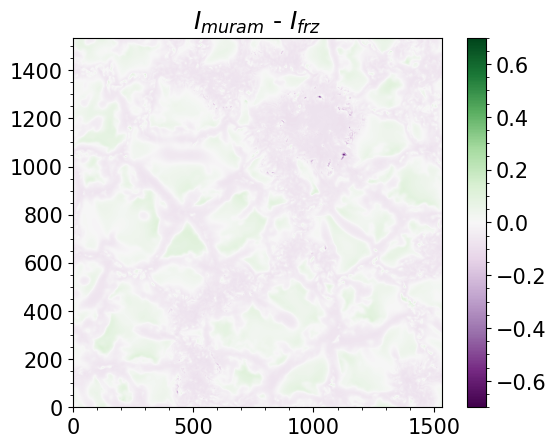

In [92]:
plt.imshow(I[:,:].T-I_630[:,:].T,origin='lower',cmap='PRGn',vmin=-0.7,vmax=0.7)
plt.colorbar()
plt.title(r'$I_{muram}$ - $I_{frz}$')

In [17]:
mean = np.mean(slice[160,800:1200,100:500])

In [18]:
I = slice[160,:,:] / mean

In [19]:
mean = np.mean(np.mean(stokes.stki[95:105,800:1200,100:500],axis=0))
I_630 = np.mean(stokes.stki[95:105,:,:],axis=0) / mean

In [ ]:
mean = np.mean(np.mean(stokes.stki[95:105,100:150,10:60],axis=0))
I_630 = np.mean(stokes.stki[95:105,:,:],axis=0) / mean

Text(0, 0.5, 'I_frz')

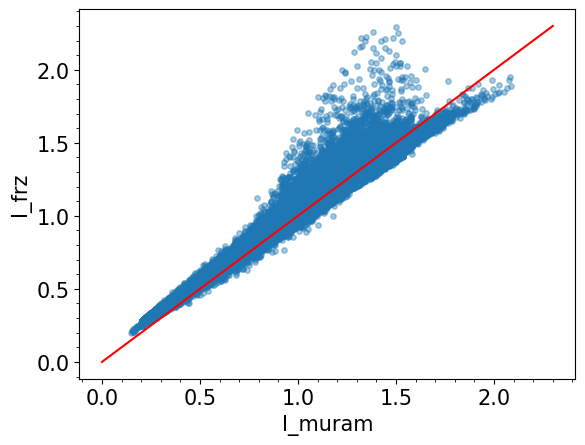

In [93]:
plt.scatter(I[:,:].flatten(),I_630[:,:].flatten(),s=15,alpha=0.4)
plt.plot([0,2.3],[0,2.3],c='r')
plt.xlabel('I_muram')
plt.ylabel('I_frz')

In [ ]:
plt.scatter(I[:,:].flatten(),I_630[:,:].flatten(),s=15,alpha=0.4)
plt.plot([0,2.3],[0,2.3],c='r')
plt.xlabel('I_muram')
plt.ylabel('I_frz')

In [ ]:
plt.scatter(I[800:1200,1000:1300].flatten(),I_630[800:1200,1000:1300].flatten(),alpha=0.5)
plt.plot([0,2.3],[0,2.3],c='r')
plt.xlabel('I_muram')
plt.ylabel('I_frz')
plt.title('pore')

In [ ]:
plt.figure(figsize=(12,5))
plt.subplot(121)
plt.imshow(I[800:1200,1000:1300].T,origin='lower',cmap='gray',vmin=0.1,vmax=2.2)
plt.colorbar()
plt.subplot(122)
plt.imshow(I_630[800:1200,1000:1300].T,origin='lower',cmap='gray',vmin=0.1,vmax=2.2)
plt.colorbar()

In [ ]:
plt.scatter(I[300:800,:600].flatten(),I_630[300:800,:600].flatten())
plt.plot([0,2.3],[0,2.3],c='r')
plt.xlabel('I_muram')
plt.ylabel('I_frz')

In [ ]:
plt.figure(figsize=(12,5))
plt.subplot(121)
plt.imshow(I[300:800,:600].T,origin='lower',cmap='gray',vmin=0.1,vmax=2.2)
plt.colorbar()
plt.subplot(122)
plt.imshow(I_630[300:800,:600].T,origin='lower',cmap='gray',vmin=0.1,vmax=2.2)
plt.colorbar()
#plt.contour(I_630[300:800,:600].T,levels=[1.0])

In [ ]:
stokes = frz.read_profile('/dat/xenosh/muram_plage_pore/20000/bin/stokes.bin')

In [ ]:
plt.plot(stokes.stki[:,60,20])

In [ ]:
plt.figure(figsize=(9,7))
plt.imshow(stokes.stki[10,:,:].T,origin='lower',cmap='gray')
plt.colorbar()

In [ ]:
plt.figure(figsize=(12,5))
plt.subplot(121)
plt.imshow(I[:,:].T,origin='lower',cmap='gray',vmin=0.1,vmax=2.2)
plt.colorbar()
plt.title('I_muram')
plt.subplot(122)
plt.imshow(stokes.stki[100,:,:].T,origin='lower',cmap='gray',vmin=0.1,vmax=2.2)
plt.colorbar()
plt.title('I_frz')

In [ ]:
stokes.wave.shape[0]

In [ ]:
b = np.zeros((192,192))
b[:,:] = np.sum(I[:,:].reshape(192,8,192,8),axis=(1,3))/ (8*8)

In [ ]:
plt.scatter(b[:,:].flatten(),I_630[:,:].flatten(),s=15,alpha=0.4)
plt.plot([0,2.],[0,2.],c='r')
plt.xlabel('I_muram')
plt.ylabel('I_frz')

In [ ]:
plt.figure(figsize=(10,4))
plt.subplot(121)
plt.imshow(stokes.stki[10,:,:].T,origin='lower',cmap='gray')
plt.colorbar()
plt.subplot(122)
plt.imshow(stokes.stki[100,:,:].T,origin='lower',cmap='gray')
plt.colorbar()

In [ ]:
plt.imshow(stokes.stki[10,:,:].T-stokes.stki[100,:,:].T,origin='lower',cmap='PuOr',norm=CenteredNorm())
plt.colorbar()

## interpolate

In [11]:
# interpolate
tau_common = np.linspace(-3,1,41)
nx = atm.tem.shape[0]
ny = atm.tem.shape[1]
nz = tau_common.shape[0]
T= np.zeros((nx,ny,nz))
P= np.zeros((nx,ny,nz))
Bx= np.zeros((nx,ny,nz))
By= np.zeros((nx,ny,nz))
Bz= np.zeros((nx,ny,nz))
Vz= np.zeros((nx,ny,nz))
Bh = np.zeros((nx,ny,nz))
a = np.zeros((nz))
z= np.zeros((nx,ny,nz))
for i in range(nx):
    for j in range(ny):
        T[i,j,:] = np.interp(tau_common, atm.tau[i,j,::-1], atm.tem[i,j,::-1])
        a = np.interp(tau_common, atm.tau[i,j,::-1], np.log10(atm.pg[i,j,::-1]))
        P[i,j,:] = 10 ** a
        Bx[i,j,:] = np.interp(tau_common, atm.tau[i,j,::-1], atm.bx[i,j,::-1])
        By[i,j,:] = np.interp(tau_common, atm.tau[i,j,::-1], atm.by[i,j,::-1])
        Bz[i,j,:] = np.interp(tau_common, atm.tau[i,j,::-1], atm.bz[i,j,::-1])
        Vz[i,j,:] = np.interp(tau_common, atm.tau[i,j,::-1], atm.vz[i,j,::-1])
        Bh[i,j,:] = np.sqrt(Bx[i,j,:]**2+By[i,j,:]**2)
        z[i,j,:] = np.interp(tau_common, atm.tau[i,j,::-1], atm.z[i,j,::-1])

In [12]:
B = np.sqrt(Bz**2+Bh**2)

In [ ]:
del(Bx,By,a,atm)

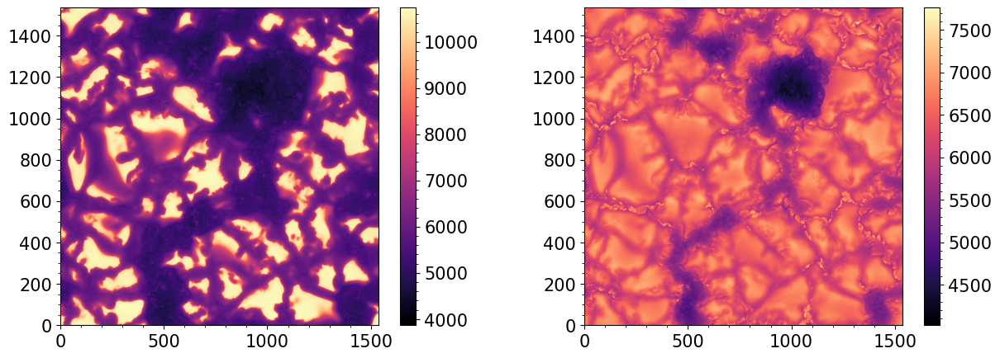

In [95]:
plt.figure(figsize=[15,5])
plt.subplot(121)
plt.imshow(atm.tem[:,:,25].T,cmap='magma',origin='lower')
plt.colorbar()
#plt.title(r'$\log\tau =0$')
plt.subplot(122)
plt.imshow(T[:,:,30].T,cmap='magma',origin='lower')
plt.colorbar()
#plt.title(r'$\log\tau =-2$')

Text(0.5, 1.0, '$\\log\\tau =-1$')

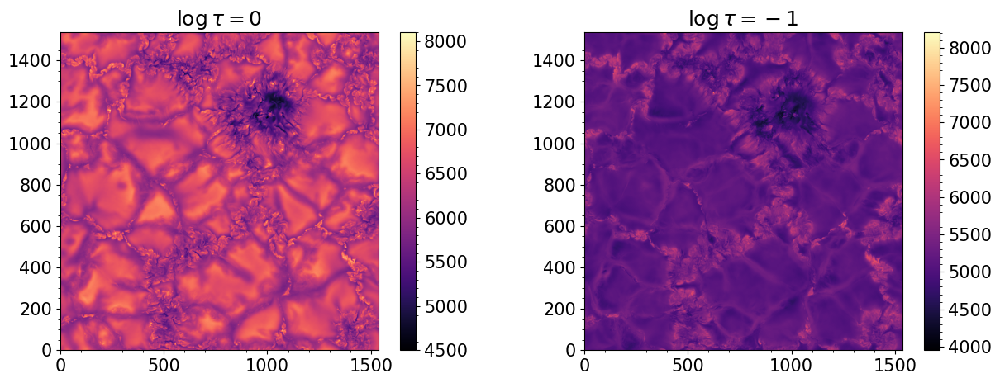

In [15]:
plt.figure(figsize=[15,5])
plt.subplot(121)
plt.imshow(T[:,:,30].T,cmap='magma',origin='lower',vmin=4500,vmax=8100)
plt.colorbar()
plt.title(r'$\log\tau =0$')
plt.subplot(122)
plt.imshow(T[:,:,20].T,cmap='magma',origin='lower')
plt.colorbar()
plt.title(r'$\log\tau =-1$')

Text(0.5, 1.0, '$\\log\\tau =-2$')

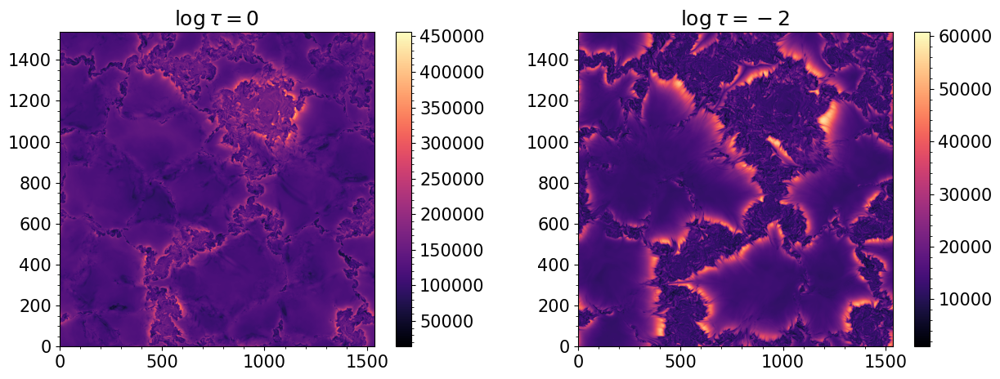

In [7]:
plt.figure(figsize=[15,5])
plt.subplot(121)
plt.imshow(P[:,:,30].T,cmap='magma',origin='lower')
plt.colorbar()
plt.title(r'$\log\tau =0$')
plt.subplot(122)
plt.imshow(P[:,:,10].T,cmap='magma',origin='lower')
plt.colorbar()
plt.title(r'$\log\tau =-2$')

Text(0.5, 1.0, '$\\log\\tau =-2$')

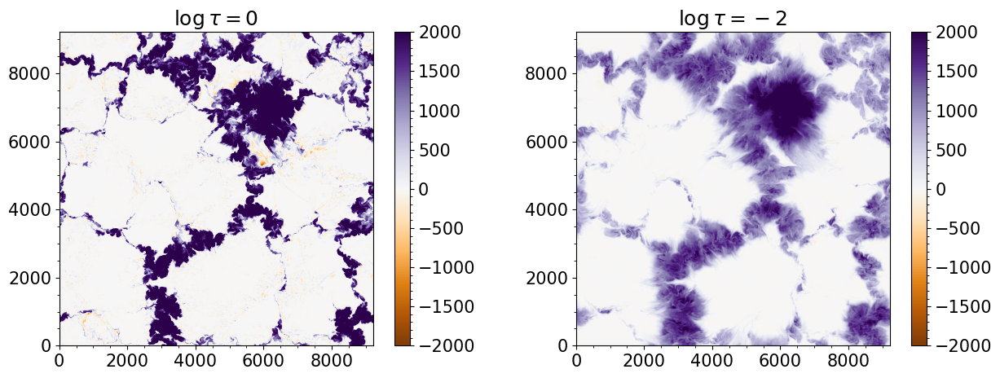

In [42]:
plt.figure(figsize=[15,5])
plt.subplot(121)
plt.imshow(Bz[:,:,30].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-2000,vcenter=0,vmax=2000),extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'$\log\tau =0$')
plt.subplot(122)
plt.imshow(Bz[:,:,10].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-2000,vcenter=0,vmax=2000),extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'$\log\tau =-2$')

Text(0.5, 1.0, '$\\log\\tau =-2$')

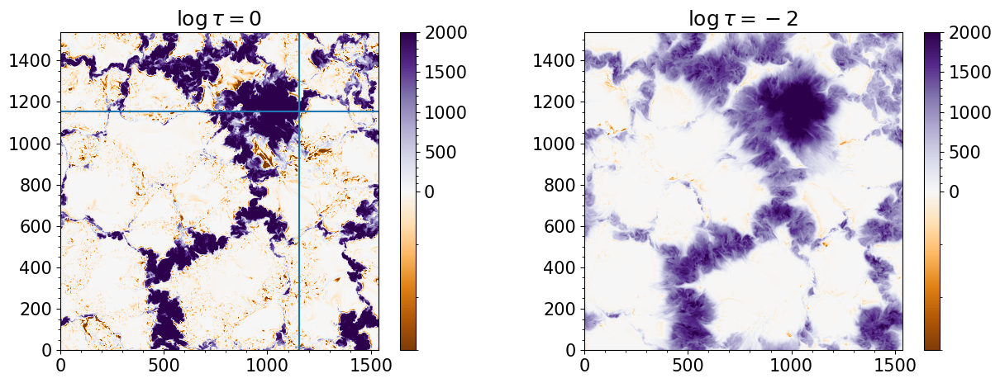

In [57]:
plt.figure(figsize=[15,5])
plt.subplot(121)
plt.imshow(Bz[:,:,30].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000))
plt.colorbar()
plt.axhline(1152)
plt.axvline(1152)
plt.title(r'$\log\tau =0$')
plt.subplot(122)
plt.imshow(Bz[:,:,10].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000))
plt.colorbar()
plt.title(r'$\log\tau =-2$')

Text(0.5, 1.0, '$\\log\\tau =-2$')

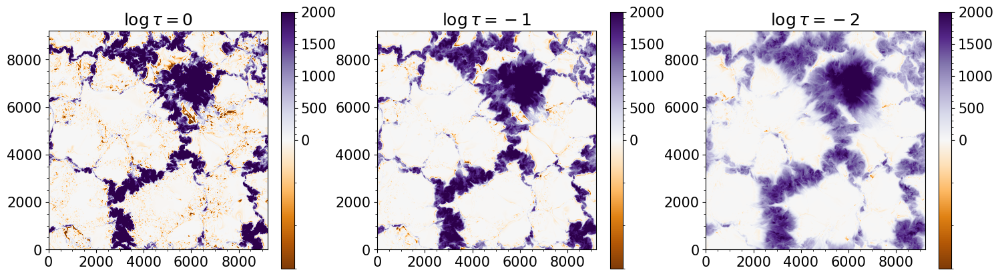

In [10]:
plt.figure(figsize=[18,5])
plt.subplot(131)
plt.imshow(Bz[:,:,30].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000),extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'$\log\tau =0$')
plt.subplot(132)
plt.imshow(Bz[:,:,20].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000),extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'$\log\tau =-1$')
plt.subplot(133)
plt.imshow(Bz[:,:,10].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000),extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'$\log\tau =-2$')

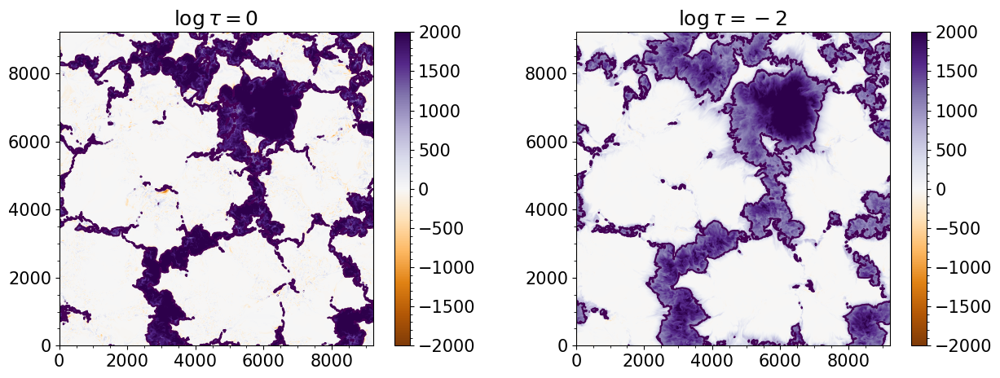

In [106]:
plt.figure(figsize=[15,5])
plt.subplot(121)
plt.imshow(Bz[:,:,30].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-2000,vcenter=0,vmax=2000),extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'$\log\tau =0$')
plt.contour(Bz[:,:,30].T,levels=[900],extent=[0,1536*6,0,1536*6])
plt.subplot(122)
plt.imshow(Bz[:,:,10].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-2000,vcenter=0,vmax=2000),extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'$\log\tau =-2$')
plt.contour(Bz[:,:,10].T,levels=[900],extent=[0,1536*6,0,1536*6])

In [ ]:
c1 = Bz[:,:,30]*2>900
core = np.argwhere(c1)
core.shape


In [ ]:
np.sqrt(9300/7700)

In [ ]:
np.mean(Bz[:,:,30])

In [ ]:
plt.figure(figsize=[15,5])
plt.subplot(121)
plt.imshow(Bz[:,:,30].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-2000,vcenter=0,vmax=2000),extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'$\log\tau =0$')
plt.subplot(122)
plt.imshow(Bz[:,:,10].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-2000,vcenter=0,vmax=2000),extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'$\log\tau =-2$')

In [101]:
cb = np.zeros((192,192,41))
for i in range(41):
    cb[:,:,i] = np.sum(Bz[:,:,i].reshape(192,8,192,8),axis=(1,3))/ (8*8)

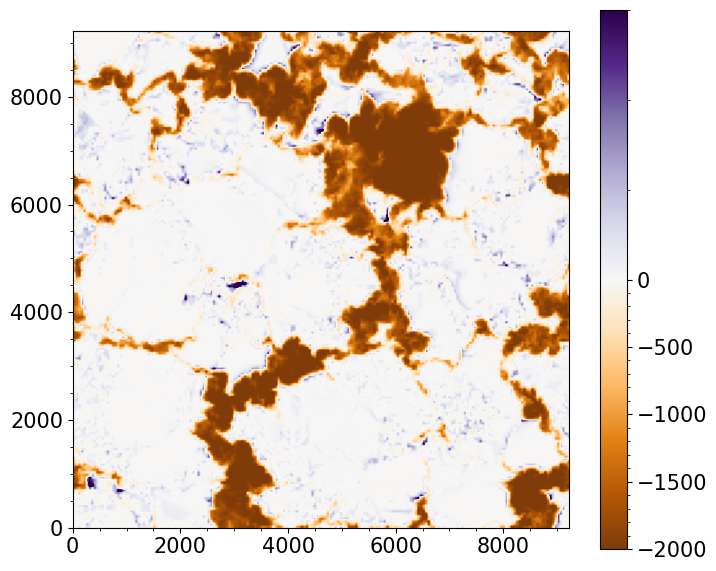

In [102]:
plt.figure(figsize=(8,7))
plt.imshow(-cb[:,:,25].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-2000,vcenter=0,vmax=300),extent=[0,1536*6,0,1536*6])
plt.colorbar()

Text(0.5, 1.0, '$\\log\\tau =-2$')

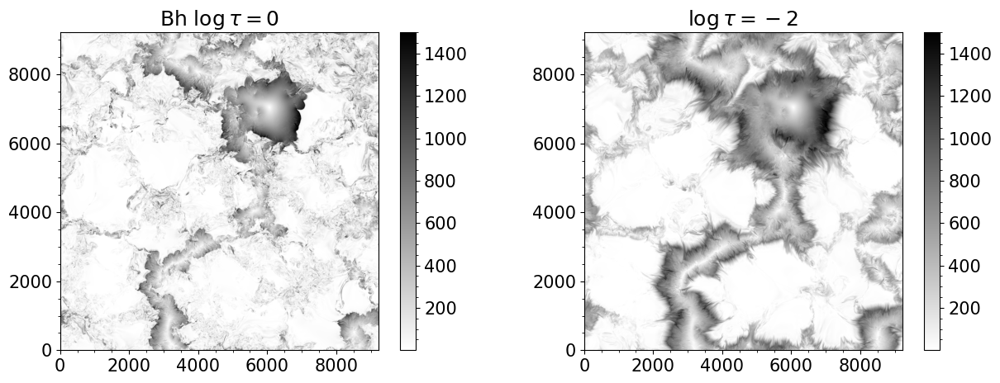

In [103]:
plt.figure(figsize=[15,5])
plt.subplot(121)
plt.imshow(Bh[:,:,30].T,cmap='binary',origin='lower', vmax=1500,extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'Bh $\log\tau =0$')
plt.subplot(122)
plt.imshow(Bh[:,:,10].T,cmap='binary',origin='lower', vmax=1500,extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'$\log\tau =-2$')

Text(0.5, 1.0, '$\\log\\tau =-2$')

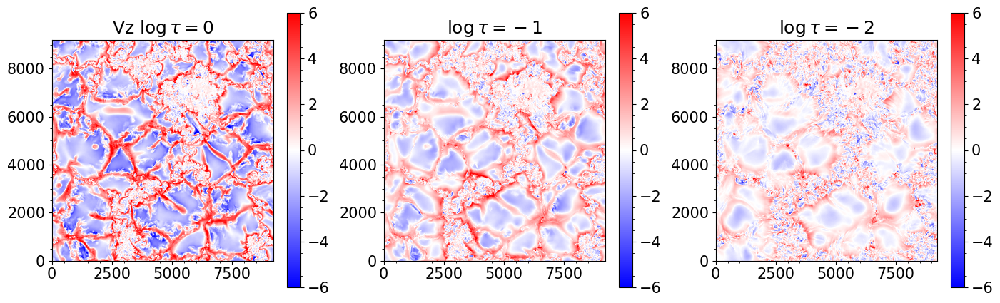

In [15]:
plt.figure(figsize=[17,5])
plt.subplot(131)
plt.imshow(Vz[:,:,30].T/1e5,cmap='bwr',origin='lower', vmin=-6,vmax=6,extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'Vz $\log\tau =0$')
plt.subplot(132)
plt.imshow(Vz[:,:,20].T/1e5,cmap='bwr',origin='lower', vmin=-6,vmax=6,extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'$\log\tau =-1$')
plt.subplot(133)
plt.imshow(Vz[:,:,10].T/1e5,cmap='bwr',origin='lower', vmin=-6,vmax=6,extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'$\log\tau =-2$')

Text(0.5, 1.0, '$\\log\\tau =-2$')

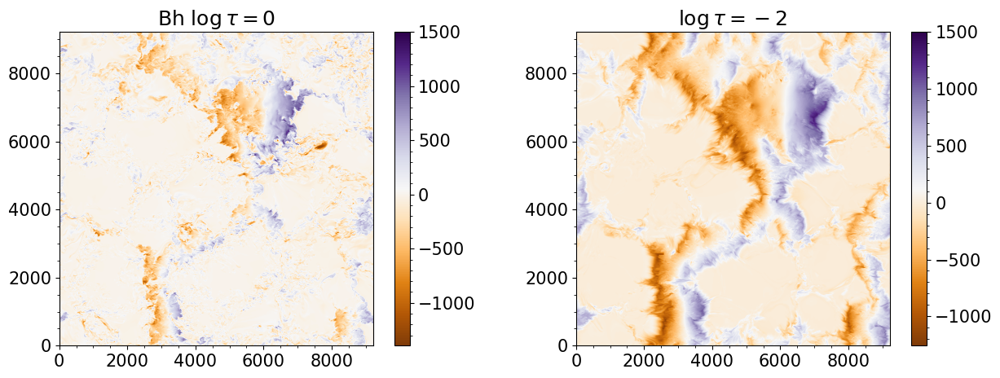

In [17]:
plt.figure(figsize=[15,5])
plt.subplot(121)
plt.imshow(Bx[:,:,30].T,cmap='PuOr',origin='lower', vmax=1500,extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'Bh $\log\tau =0$')
plt.subplot(122)
plt.imshow(Bx[:,:,10].T,cmap='PuOr',origin='lower', vmax=1500,extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'$\log\tau =-2$')

Text(0.5, 1.0, '$\\log\\tau =-2$')

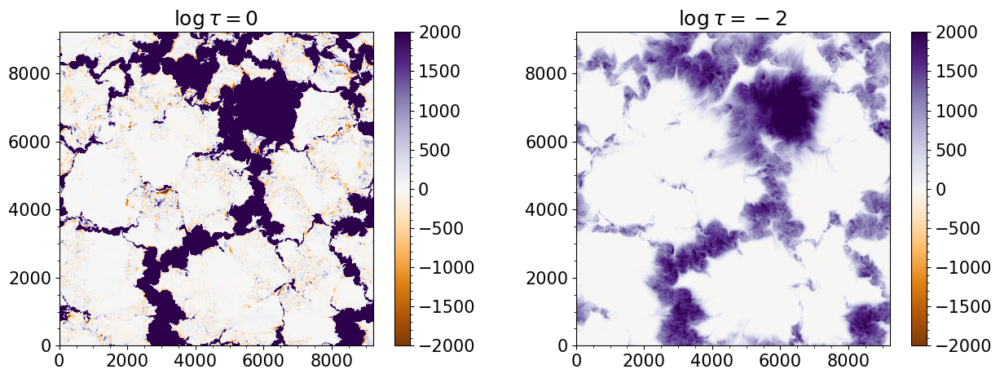

In [105]:
plt.figure(figsize=[15,5])
plt.subplot(121)
plt.imshow(Bz[:,:,30].T*np.sqrt(4*np.pi),cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-2000,vcenter=0,vmax=2000),extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'$\log\tau =0$')
plt.subplot(122)
plt.imshow(Bz[:,:,10].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-2000,vcenter=0,vmax=2000),extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'$\log\tau =-2$')

In [ ]:
10//2.0

5  026  1   5250.2086  5.0D0.0  7.0D1.0  -4.890   0.121               ps 

Text(0.5, 1.0, '$\\log\\tau =-2$')

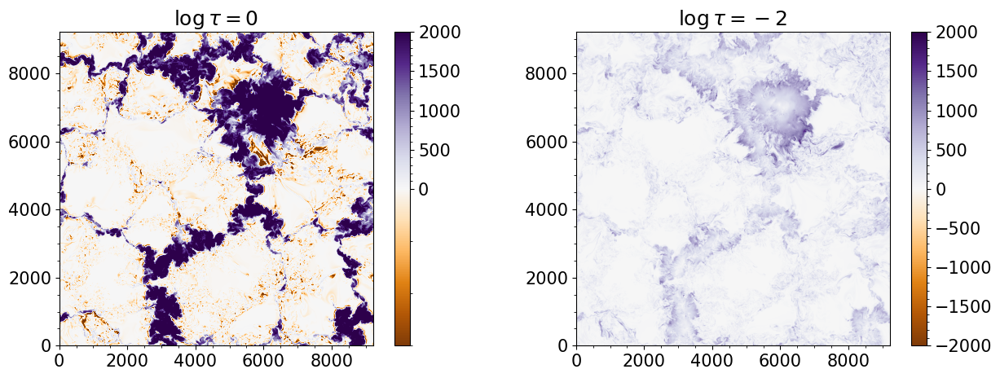

In [18]:
plt.figure(figsize=[15,5])
plt.subplot(121)
plt.imshow(Bz[:,:,30].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000),extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'$\log\tau =0$')
plt.subplot(122)
plt.imshow(Bh[:,:,30].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-2000,vcenter=0,vmax=2000),extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'$\log\tau =-2$')

Text(0.5, 1.0, '$\\log\\tau =0$')

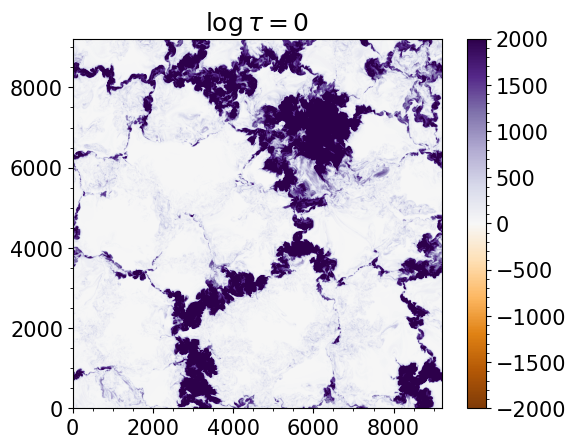

In [19]:
plt.imshow(B[:,:,30].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-2000,vcenter=0,vmax=2000),extent=[0,1536*6,0,1536*6])
plt.colorbar()
plt.title(r'$\log\tau =0$')

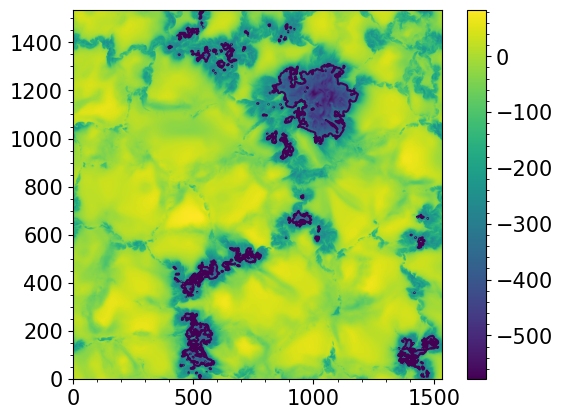

In [24]:
plt.imshow(z[:,:,30].T-640,origin='lower')
plt.colorbar()
plt.contour(z[:,:,30].T-640,levels=[-300])

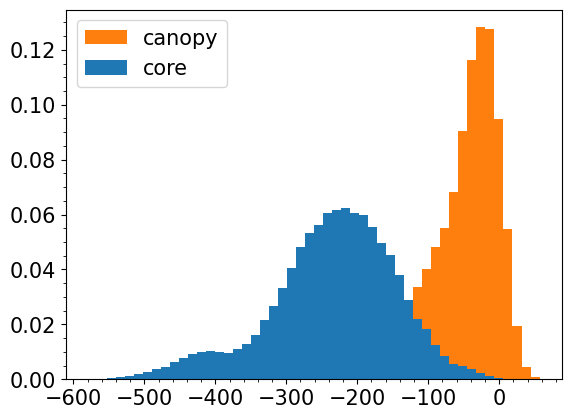

In [38]:
plt.hist([z[core[:,0],core[:,1],30].flatten()-640,z[canopy[:,0],canopy[:,1],30].flatten()-640],bins=50,histtype='stepfilled',label=['core','canopy']
         ,weights=[[1/core.shape[0]]*core.shape[0],[1/canopy.shape[0]]*canopy.shape[0]])
plt.legend()

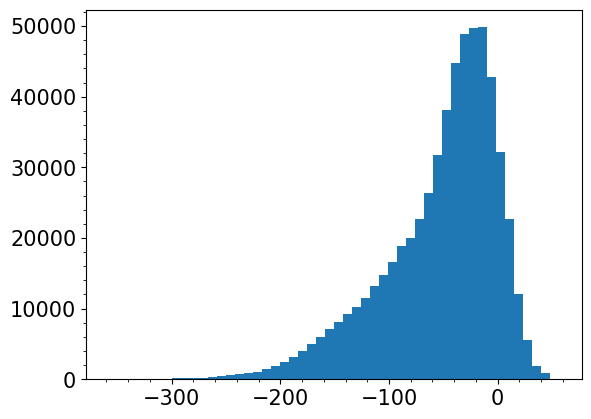

In [32]:
plt.hist(z[canopy[:,0],canopy[:,1],30].flatten()-640,bins=50)
plt.show()

In [17]:
np.mean(z[:600,600:1200,30])

640.0709838533621

## define core, canopy, qs

In [13]:
c1 = B[:,:,30]>1000
c2 = B[:,:,30]<100
core = np.argwhere(c1)
qs = np.argwhere(c2)

In [14]:
c0 = stokes.stki[100,:,:]/1.026 < 0.65
pore = np.argwhere(c0 & c1)

In [15]:
c8 = B[:,:,10] > 300
c9 = stokes.stki[100,:,:]/1.026 > 0.85
plage = np.argwhere(c8)

In [64]:
from tqdm import tqdm
# Create a 2D mask for the XY plane
mask2d = np.ones((B.shape[0], B.shape[1]), dtype=bool)

mask2d[core[:,0], core[:,1]] = False  # mark these pixels as excluded

# Expand mask to 3D and apply it
mask3d = np.zeros_like(B)
mask3d = np.broadcast_to(mask2d, (B.shape[2],B.shape[0], B.shape[1]))
mask3d = mask3d.transpose(1,2,0)
#mask3d[:,:,None] =mask2d
filtered_data = B[mask3d]  # this returns a 1D array


In [66]:
del(mask2d,mask3d,filtered_data)

In [68]:
B[core[:,0],core[:,1],:] = np.nan

In [16]:
c3 = B[:,:,10] > 300
c4 = B[:,:,10] - B[:,:,30] > 100
c5 = B[:,:,30] < 1000
canopy = np.argwhere(c5 & c3 & c4)

In [45]:
del(canopy)

In [17]:
c6 = Bz[:,:,30] < -50
c7 = B[:,:,10] > 300
oppo = np.argwhere(c6 & c7)

In [28]:
oppo.shape

(118332, 2)

In [18]:
print(qs.shape)
print(core.shape)
print(canopy.shape)
print(oppo.shape)

(1220870, 2)
(484168, 2)
(602763, 2)
(135168, 2)


In [19]:
core.shape[0]/1536/1536

0.20521714952256945

In [21]:
np.sqrt((core.shape[0]+canopy.shape[0])/core.shape[0])

1.4983143759464257

In [20]:
oppo.shape[0]/1536/1536

0.057291666666666664

In [29]:
np.mean(Bz[oppo[:,0],oppo[:,1],30])

-179.98870184641996

In [30]:
np.mean(Bz[oppo[:,0],oppo[:,1],25])

203.6563687813436

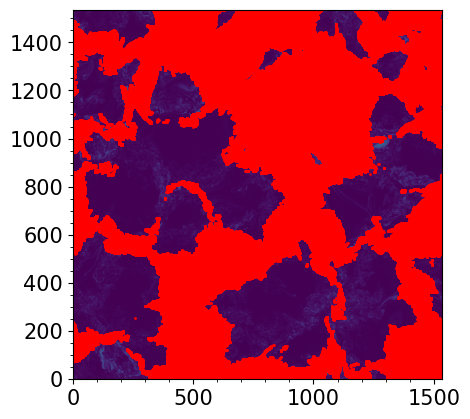

In [25]:
plt.imshow(B[:,:,30].T,origin='lower')
plt.scatter(plage[:,0],plage[:,1],color='red',s=1)

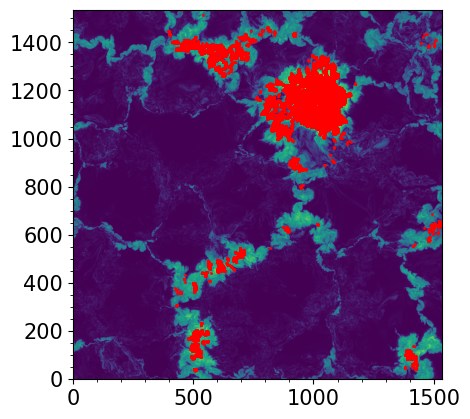

In [86]:
plt.imshow(B[:,:,30].T,origin='lower')
plt.scatter(pore[:,0],pore[:,1],color='red',s=1)

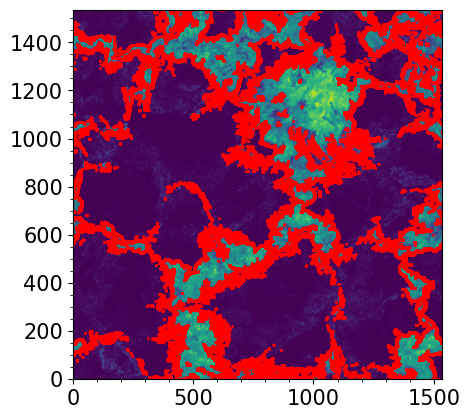

In [21]:
plt.imshow(B[:,:,30].T,origin='lower')
plt.scatter(oppo[:,0],oppo[:,1],color='red',s=1)

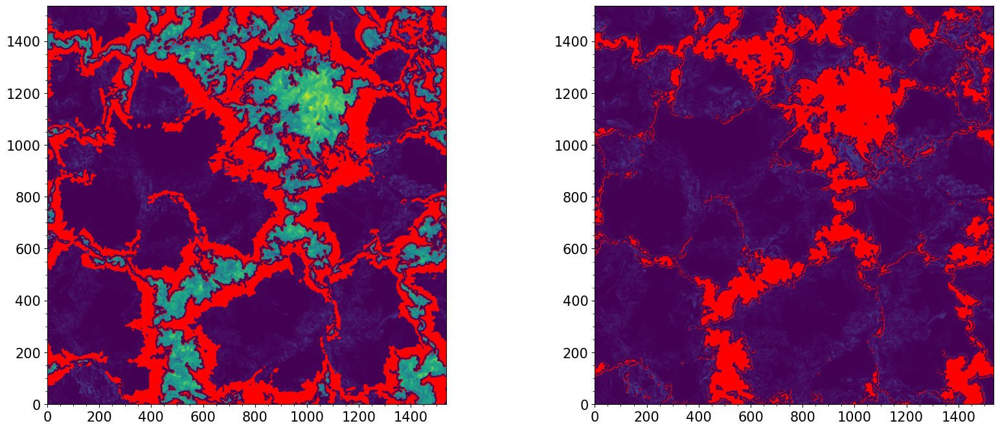

In [60]:
plt.figure(figsize=(20,8))
plt.subplot(121)
plt.imshow(B[:,:,30].T,origin='lower')
plt.contour(B[:,:,30].T,levels=[1000])
plt.scatter(canopy[:,0],canopy[:,1],color='red',s=1)
plt.subplot(122)
plt.imshow(B[:,:,30].T,origin='lower')
plt.contour(B[:,:,30].T,levels=[1000])
plt.scatter(core[:,0],core[:,1],color='red',s=1)

## hist

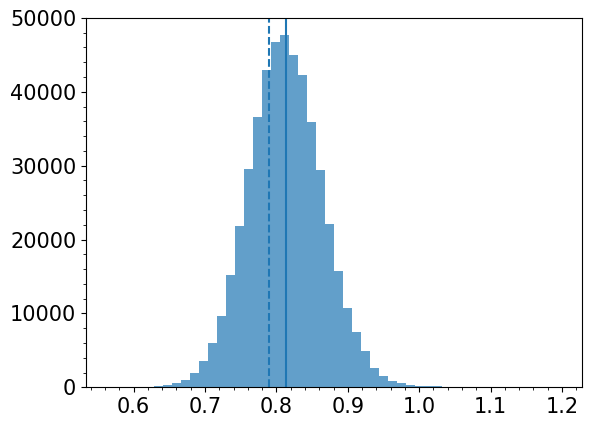

In [15]:
plt.figure()
plt.hist(T[core[:,0],core[:,1],7]/T[core[:,0],core[:,1],30],bins=50,alpha=0.7)
plt.axvline(0.79,ls='--')
plt.axvline(np.mean(T[core[:,0],core[:,1],7]/T[core[:,0],core[:,1],30]))

In [14]:
np.mean(T[core[:,0],core[:,1],7]/T[core[:,0],core[:,1],30])

0.8130203181050891

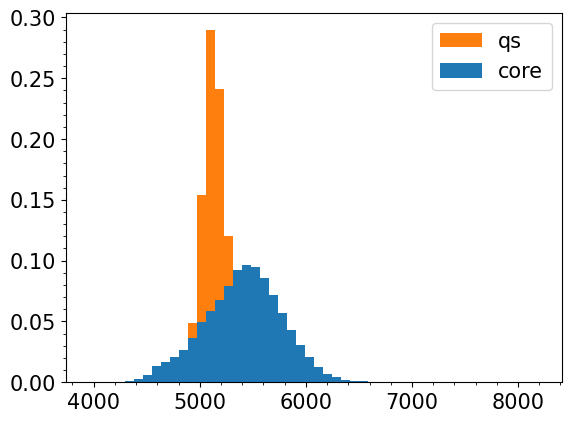

In [ ]:
#log tau = -1
plt.figure()
plt.hist([T[core[:,0],core[:,1],20].flatten(),T[qs[:,0],qs[:,1],20].flatten()],bins=50,label=['core','qs'],histtype='stepfilled',
         weights = [[1/len(T[core[:,0],core[:,1],20].flatten())] * len(T[core[:,0],core[:,1],20].flatten()),[1/len(T[qs[:,0],qs[:,1],20].flatten())] * len(T[qs[:,0],qs[:,1],20].flatten())])
plt.legend()

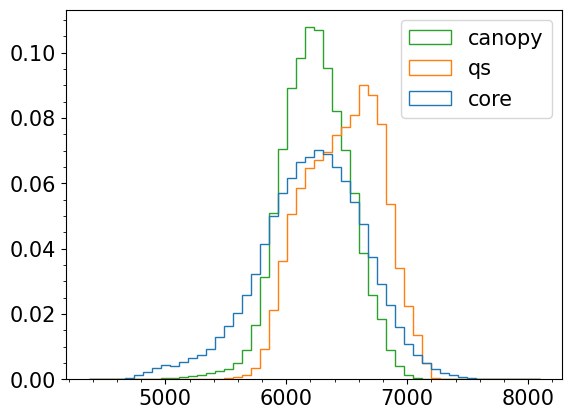

In [ ]:
# log tau = 0 
plt.figure()
plt.hist([T[core[:,0],core[:,1],30].flatten(),T[qs[:,0],qs[:,1],30].flatten(),T[canopy[:,0],canopy[:,1],30].flatten()],bins=50,label=['core','qs','canopy'],histtype='step',
         weights = [[1/core.shape[0]] * core.shape[0],[1/qs.shape[0]] * qs.shape[0],[1/canopy.shape[0]] * canopy.shape[0]])
plt.legend()

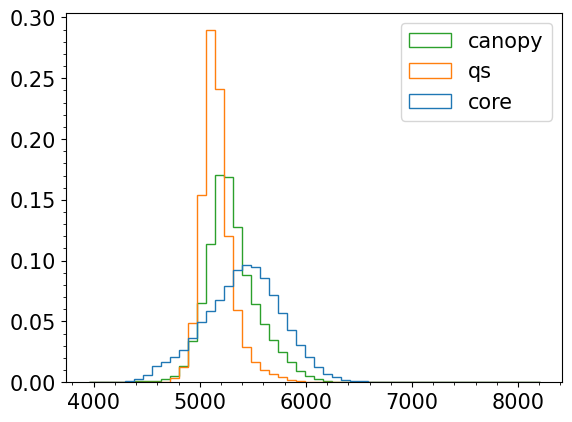

In [ ]:
# log tau = -1
plt.figure()
plt.hist([T[core[:,0],core[:,1],20].flatten(),T[qs[:,0],qs[:,1],20].flatten(),T[canopy[:,0],canopy[:,1],20].flatten()],bins=50,label=['core','qs','canopy'],histtype='step',
         weights = [[1/core.shape[0]] * core.shape[0],[1/qs.shape[0]] * qs.shape[0],[1/canopy.shape[0]] * canopy.shape[0]])
plt.legend()

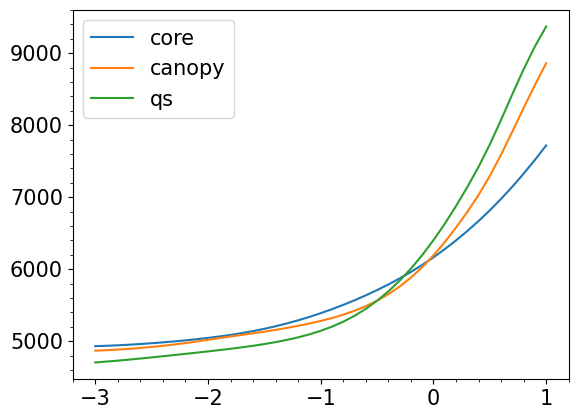

In [16]:
plt.plot(tau_common,np.mean(T[core[:,0],core[:,1],:],axis=0),label='core')
plt.plot(tau_common,np.mean(T[canopy[:,0],canopy[:,1],:],axis=0),label='canopy')
plt.plot(tau_common,np.mean(T[qs[:,0],qs[:,1],:],axis=0),label='qs')
plt.legend()

Text(0, 0.5, 'Intensity [Ic]')

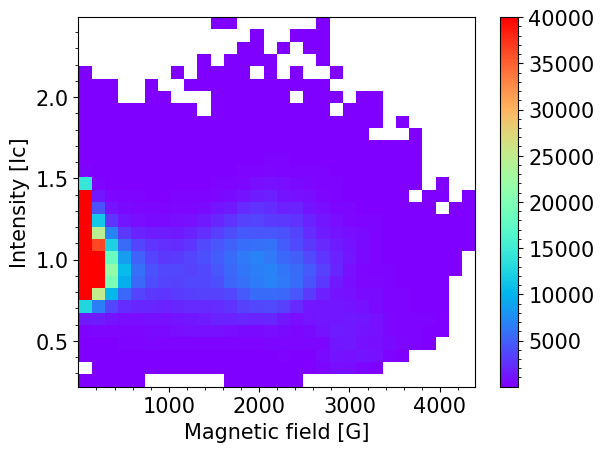

In [16]:
hist, xedges, yedges = np.histogram2d(B[:,:,30].flatten(),np.mean(stokes.stki[190:200,:,:],axis=0).flatten(),bins=30)
mask = np.ma.masked_where(hist ==0, hist)
cmap = plt.cm.rainbow
cmap.set_bad(color='white')
fig, ax = plt.subplots()
mesh = ax.pcolormesh(xedges, yedges, mask.T, cmap=cmap,vmax=40000)

plt.colorbar(mesh, ax=ax)
plt.xlabel('Magnetic field [G]')
plt.ylabel('Intensity [Ic]')

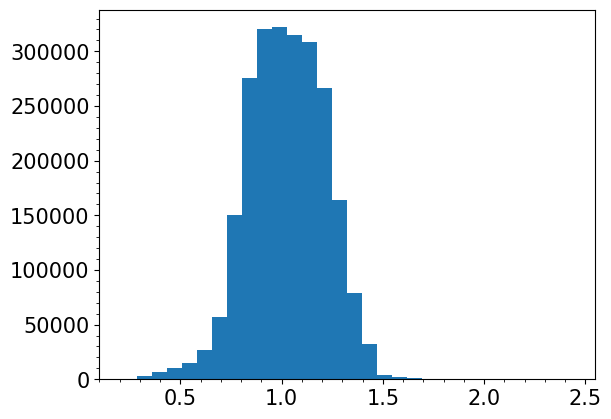

In [27]:
plt.hist(np.mean(stokes.stki[90:100,:,:],axis=0).flatten(),bins=30)
plt.show()

In [17]:
inc = np.arctan2(Bh[:,:,:],Bz[:,:,:])*180/np.pi

(0.0, 90.0)

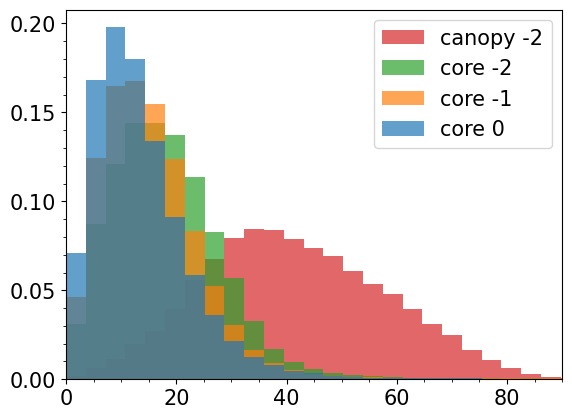

In [21]:
plt.hist([inc[core[:,0],core[:,1],30],inc[core[:,0],core[:,1],20],inc[core[:,0],core[:,1],10],inc[canopy[:,0],canopy[:,1],10]],bins=50,label=['core 0','core -1','core -2','canopy -2'],histtype='stepfilled',alpha=0.7,
         weights=[[1/core.shape[0]]*core.shape[0],[1/core.shape[0]]*core.shape[0],[1/core.shape[0]]*core.shape[0],[1/canopy.shape[0]]*canopy.shape[0]])
plt.legend()
plt.xlim([0,90])

In [20]:
print(np.mean(inc[core[:,0],core[:,1],30]))
print(np.mean(inc[core[:,0],core[:,1],20]))
print(np.mean(inc[core[:,0],core[:,1],10]))


14.193293491833469
16.5263304902521
18.665692240770763


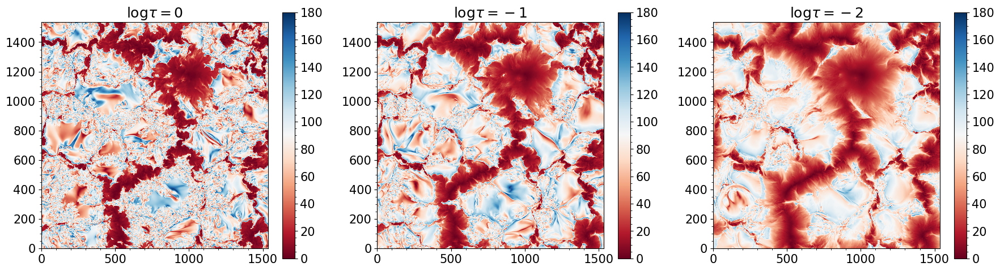

In [36]:
plt.figure(figsize=(18,5))
plt.subplot(131)
plt.imshow(inc[:,:,30].T,vmin=0,vmax=180,origin='lower',cmap='RdBu')
plt.title(r'log$\tau=0$')
plt.colorbar()
#plt.contour(inc[:,:,30].T,levels=[25,155])
plt.subplot(132)
plt.imshow(inc[:,:,20].T,vmin=0,vmax=180,origin='lower',cmap='RdBu')
plt.title(r'log$\tau=-1$')
plt.colorbar()
#plt.contour(inc[:,:,20].T,levels=[25,155])
plt.subplot(133)
plt.imshow(inc[:,:,10].T,vmin=0,vmax=180,origin='lower',cmap='RdBu')
plt.title(r'log$\tau=-2$')
plt.colorbar()
#plt.contour(inc[:,:,10].T,levels=[25,155])
plt.tight_layout()

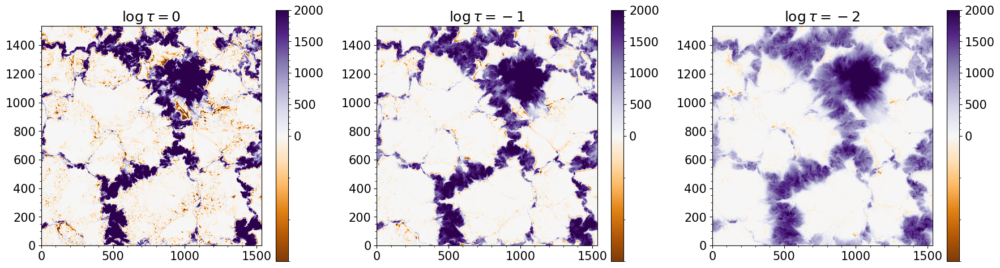

In [38]:
plt.figure(figsize=[18,5])
plt.subplot(131)
plt.imshow(Bz[:,:,30].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000))
plt.colorbar()
plt.title(r'$\log\tau =0$')
plt.subplot(132)
plt.imshow(Bz[:,:,20].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000))
plt.colorbar()
plt.title(r'$\log\tau =-1$')
plt.subplot(133)
plt.imshow(Bz[:,:,10].T,cmap='PuOr',origin='lower', norm=TwoSlopeNorm(vmin=-300,vcenter=0,vmax=2000))
plt.colorbar()
plt.title(r'$\log\tau =-2$')
plt.tight_layout()

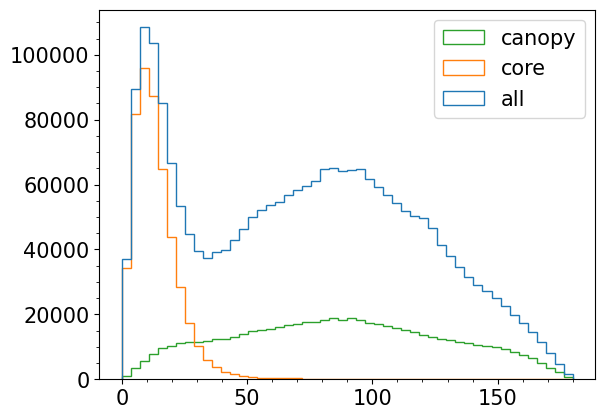

In [ ]:
# log tau = 0
plt.hist([inc[:,:,30].flatten(),inc[core[:,0],core[:,1],30].flatten(),inc[canopy[:,0],canopy[:,1],30]],bins=50,label=['all','core','canopy'],histtype='step')
         #,weights=[[1/1536/1536]*1536*1536,[1/core.shape[0]] * core.shape[0],[1/canopy.shape[0]] * canopy.shape[0]])
plt.legend()

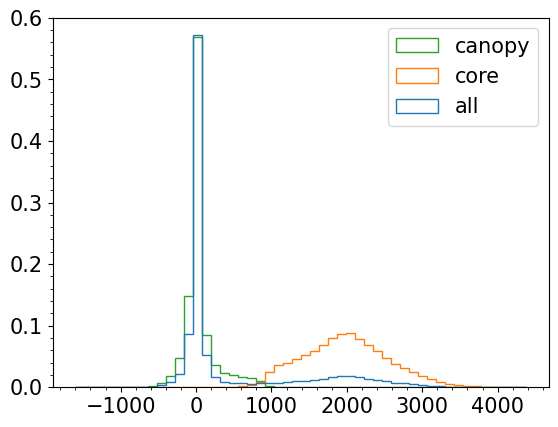

In [20]:
plt.hist([Bz[:,:,30].flatten(),Bz[core[:,0],core[:,1],30].flatten(),Bz[canopy[:,0],canopy[:,1],30]],bins=50,label=['all','core','canopy'],histtype='step'
         ,weights=[[1/1536/1536]*1536*1536,[1/core.shape[0]] * core.shape[0],[1/canopy.shape[0]] * canopy.shape[0]])
plt.legend()

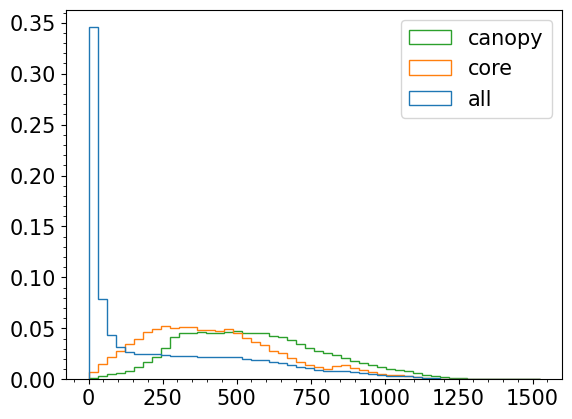

In [58]:
plt.hist([Bh[:,:,10].flatten(),Bh[core[:,0],core[:,1],10].flatten(),Bh[canopy[:,0],canopy[:,1],10]],bins=50,label=['all','core','canopy'],histtype='step',
         weights=[[1/1536/1536]*1536*1536,[1/core.shape[0]] * core.shape[0],[1/canopy.shape[0]] * canopy.shape[0]])
plt.legend()

In [34]:
str("%.2f" %time[1,649])

'1076.79'

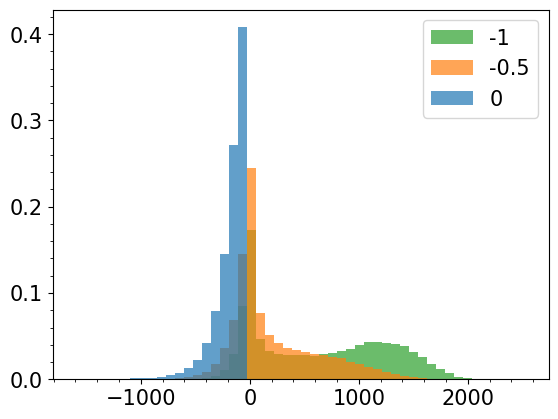

In [50]:
plt.hist([Bz[oppo[:,0],oppo[:,1],30].flatten(),Bz[oppo[:,0],oppo[:,1],25].flatten(),Bz[oppo[:,0],oppo[:,1],20].flatten()],bins=50,label=['0','-0.5','-1'],histtype='stepfilled',alpha=0.7,
         weights=[[1/oppo.shape[0]]*oppo.shape[0],[1/oppo.shape[0]] * oppo.shape[0],[1/oppo.shape[0]] * oppo.shape[0]])
plt.legend()

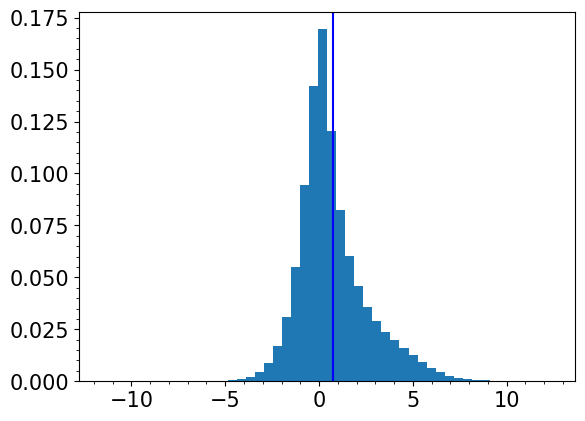

In [30]:
plt.hist(Vz[core[:,0],core[:,1],30].flatten()/1e5,bins=50,weights=[1/core.shape[0]]*core.shape[0])
plt.axvline(np.mean(Vz[core[:,0],core[:,1],30]/1e5),c='b')
plt.show()

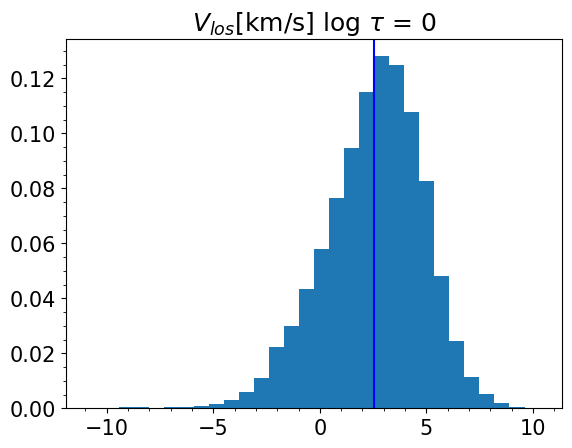

In [36]:
plt.hist(Vz[oppo[:,0],oppo[:,1],30].flatten()/1e5,bins=30,weights=[1/oppo.shape[0]]*oppo.shape[0])
plt.axvline(np.mean(Vz[oppo[:,0],oppo[:,1],30]/1e5),c='b')
plt.title(r'$V_{los}$[km/s] log $\tau$ = 0')
plt.show()

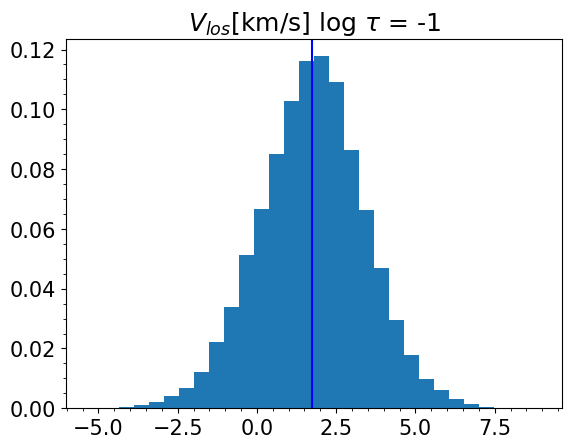

In [15]:
plt.hist(Vz[oppo[:,0],oppo[:,1],20].flatten()/1e5,bins=30,weights=[1/oppo.shape[0]]*oppo.shape[0])
plt.axvline(np.mean(Vz[oppo[:,0],oppo[:,1],20]/1e5),c='b')
plt.title(r'$V_{los}$[km/s] log $\tau$ = -1')
plt.show()

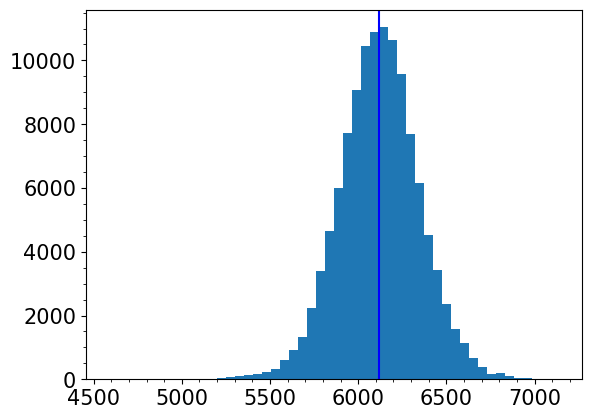

In [27]:
plt.hist(T[oppo[:,0],oppo[:,1],30],bins=50,histtype='stepfilled')
plt.axvline(np.mean(T[oppo[:,0],oppo[:,1],30]),c='b')
plt.show()

In [46]:
np.mean(T[oppo[:,0],oppo[:,1],30])

6119.93772281233

In [48]:
np.mean(z[core[:,0],core[:,1],30])

411.0303234137636

Text(0.5, 1.0, 'By')

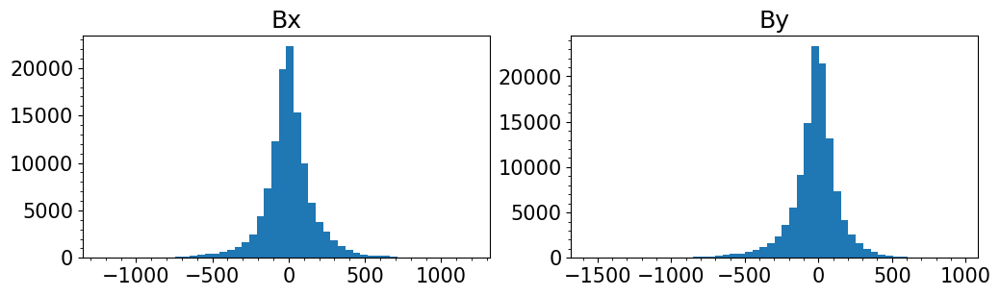

In [38]:
plt.figure(figsize=(12,3))
plt.subplot(121)
plt.hist(Bx[oppo[:,0],oppo[:,1],30],bins=50)
plt.title('Bx')
plt.subplot(122)
plt.hist(By[oppo[:,0],oppo[:,1],30],bins=50)
plt.title('By')

In [39]:
print(np.std(Bx[oppo[:,0],oppo[:,1],30]))
print(np.std(By[oppo[:,0],oppo[:,1],30]))

170.44443868487602
171.03782171185006


In [21]:
print(np.mean(Bx[oppo[:,0],oppo[:,1],30]))
print(np.mean(By[oppo[:,0],oppo[:,1],30]))

1.259395615329203
-23.883335690571833


In [41]:
print(np.std(Bz[oppo[:,0],oppo[:,1],30]))
print(np.mean(Bz[oppo[:,0],oppo[:,1],30]))

145.31195389287763
-179.98870184641996


In [ ]:
plt.figure(figsize=())
plt.subplot()
plt.imshow()
plt.subplot()
plt.hist()

## poynting flux

$S_z = \frac{1}{4 \pi}[v_z B^2_h - (v_h \cdot \bm{B_h})B_z] = \frac{1}{4 \pi}[v_z B^2_h -(v_x*B_x +v_y*B_y)B_z] $

In [ ]:
vh = np.sqrt(atm.vx**2+atm.vy**2)
bh = np.sqrt(atm.bx**2+atm.by**2)

In [15]:
S = (-atm.vz*(atm.bx**2+atm.by**2) - (atm.vx*atm.bx+atm.vy*atm.by)*atm.bz )/(4*np.pi)

In [22]:
S_interp = np.zeros((nx,ny,nz))
for i in range(nx):
    for j in range(ny):
        S_interp[i,j,:] = np.interp(tau_common, atm.tau[i,j,::-1], S[i,j,::-1])

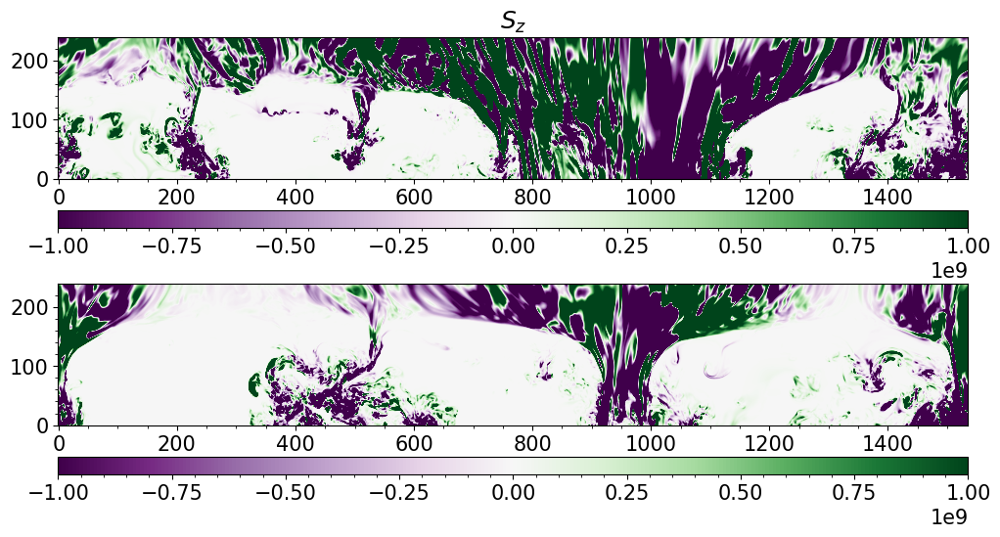

In [16]:
plt.figure(figsize=(12,6))
plt.subplot(211)
plt.imshow(S[:,1100,:].T,origin='lower',cmap='PRGn',vmin=-1e9,vmax=1e9)
plt.colorbar(location='bottom',aspect=50)
plt.title(r'$S_z$')
plt.subplot(212)
plt.imshow(S[:,768,:].T,origin='lower',cmap='PRGn',vmin=-1e9,vmax=1e9)
plt.colorbar(location='bottom',aspect=50)

Text(0.5, 1.0, '$S_z$')

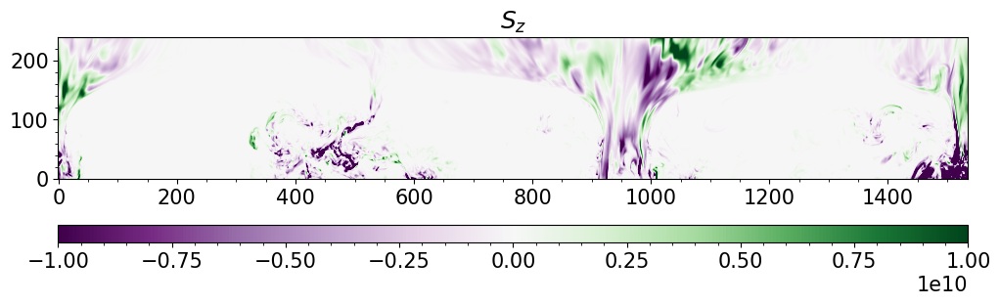

In [17]:
plt.figure(figsize=(12,4))
plt.imshow(S[:,768,:].T,origin='lower',cmap='PRGn',vmin=-1e10,vmax=1e10)
plt.colorbar(location='bottom',aspect=50)
plt.title(r'$S_z$')

Text(0, 0.5, 'y [Mm]')

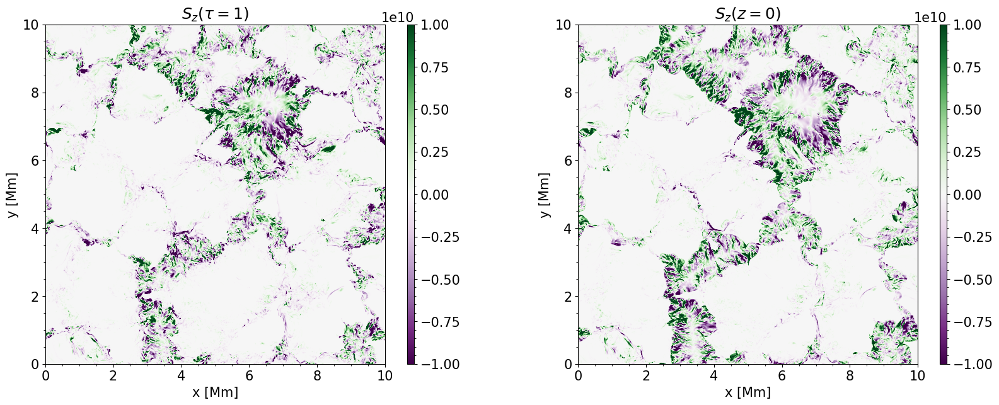

In [162]:
plt.figure(figsize=(20,7))
plt.subplot(121)
plt.imshow(S_interp[:,:,30].T,origin='lower',cmap='PRGn',vmin=-1e10,vmax=1e10,extent=[0,10,0,10])
plt.colorbar(aspect=50)
plt.title(r'$S_z (\tau=1)$')
plt.xlabel('x [Mm]')
plt.ylabel('y [Mm]')
plt.subplot(122)
plt.imshow(S[:,:,109].T,origin='lower',cmap='PRGn',vmin=-1e10,vmax=1e10,extent=[0,10,0,10])
plt.colorbar(aspect=50)
plt.title(r'$S_z (z=0)$')
plt.xlabel('x [Mm]')
plt.ylabel('y [Mm]')

In [65]:
S_interp[core[:,0],core[:,1],:].shape

(484168, 41)

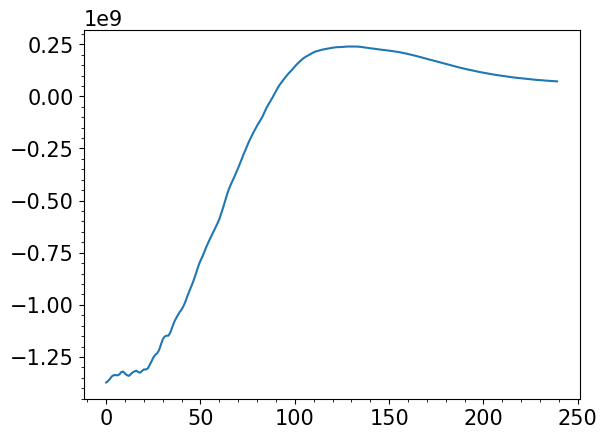

In [150]:
plt.plot(np.mean(S,axis=(0,1)))

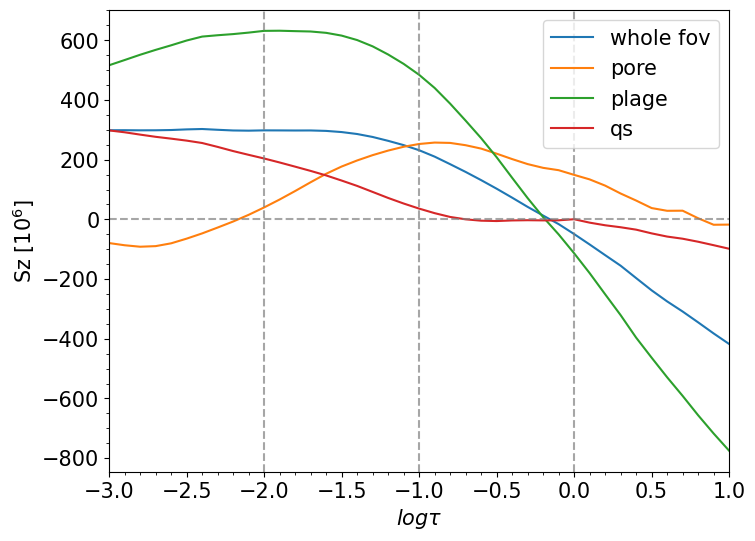

In [26]:
plt.figure(figsize=(8,6))
plt.plot(tau_common,np.mean(S_interp,axis=(0,1))/1e6,label='whole fov')
plt.plot(tau_common,np.mean(S_interp[pore[:,0],pore[:,1],:],axis=0)/1e6,label='pore')
#plt.plot(tau_common,np.mean(S_interp[core[:,0],core[:,1],:],axis=0)/1e6,label='core plage')
#plt.plot(tau_common,np.mean(S_interp[canopy[:,0],canopy[:,1],:],axis=0)/1e6,label='plage canopy')
plt.plot(tau_common,np.mean(S_interp[plage[:,0],plage[:,1],:],axis=0)/1e6,label='plage')
plt.plot(tau_common,np.mean(S_interp[qs[:,0],qs[:,1],:],axis=0)/1e6,label='qs')
plt.ylabel(r'Sz [$10^6$]')
plt.xlabel(r'$log \tau$')
plt.xlim([-3,1])
plt.legend()
plt.axvline(-2,color='gray',ls='--',alpha=0.7)
plt.axvline(-1,color='gray',ls='--',alpha=0.7)
plt.axvline(0,color='gray',ls='--',alpha=0.7)
plt.axhline(0,color='gray',ls='--',alpha=0.7)

In [169]:
np.mean(S_interp[core[:,0],core[:,1],:])/1e7

23.112670223375602

## wilson depression

In [46]:
np.mean(z[200:700,600:1100,30])/6

108.91665168557235

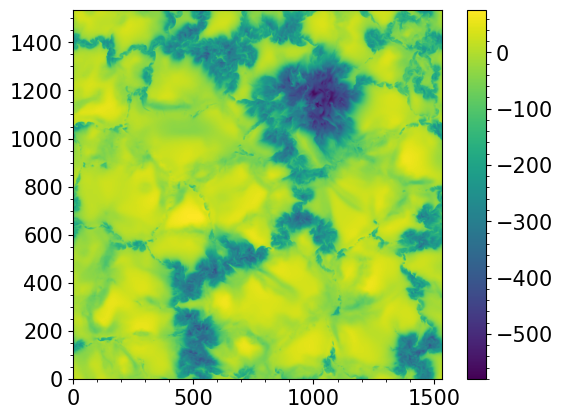

In [60]:
plt.imshow(z[:,:,30].T-650,origin='lower')
plt.colorbar()

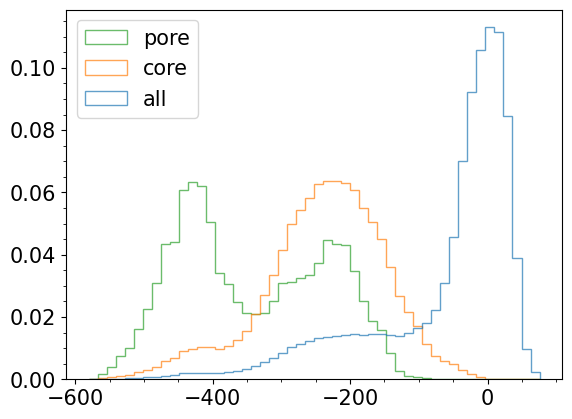

In [43]:
plt.hist([z[:,:,30].flatten()-650,z[core[:,0],core[:,1],30]-650,z[pore[:,0],pore[:,1],30]-650],bins=50,histtype='step',alpha=0.7,label=['all','core','pore']
         ,weights=[[1/1536/1536]*1536*1536,[1/core.shape[0]]*core.shape[0],[1/pore.shape[0]]*pore.shape[0]])
plt.legend()

## expansion of magnetic field

In [86]:
np.max(B[1300:,:300,30])

3626.922058344156

In [105]:
r = 900/np.max(B[1300:,:300,30])

In [47]:
a1 = B[:,:,30]/np.max(B[:,:,30]) >r
p1 = np.argwhere(a1)
p1.shape[0]

498840

In [48]:
a2 = B[:,:,10]/np.max(B[:,:,10]) >r
p2 = np.argwhere(a2)
p2.shape[0]

941106

In [49]:
np.sqrt(p2.shape[0]/p1.shape[0])

1.3735315381220852

In [106]:
p = np.zeros((30))
for i in range(30):
    c = B[1300:,:300,i+1]/np.max(B[1300:,:300,i+1]) >r
    p[i] = np.argwhere(c).shape[0]

In [107]:
R = np.sqrt(p/p[29])

(0.0, 2.4)

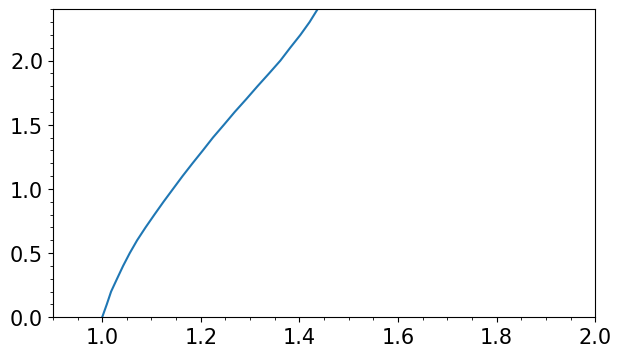

In [108]:
plt.figure(figsize=(7,4))
plt.plot(R[:],-tau_common[1:31])
plt.xlim([0.9,2.0])
plt.ylim([0.0,2.4])